In [9]:
import pandas as pd
import os, glob
import numpy as np
import seaborn as sns
import time
from utils import config

params = config()
print(params)
results_path = params['results']
riders_path = params['riders']
final_path = params['final']



{'results': './cycling_big/data/results', 'riders': './cycling_big/data/rider_infos.csv', 'final': 'final.csv'}


Results: Clearing and Feature Selection

Initial count:  5422032
After Cleaning:  1548945
Rnk                             1
Race_GC                       1.0
Rider        AAEN JØRGENSEN Jonas
Age                            18
Pnt                           0.0
Time                       5077.0
Length_km                    57.0
Year                         2012
Speed                   12.269058
dtype: object
Rnk                      199
Race_GC                199.0
Rider        ȚVETCOV Serghei
Age                       44
Pnt                    100.0
Time                 30983.0
Length_km              264.0
Year                    2021
Speed              51.234076
dtype: object


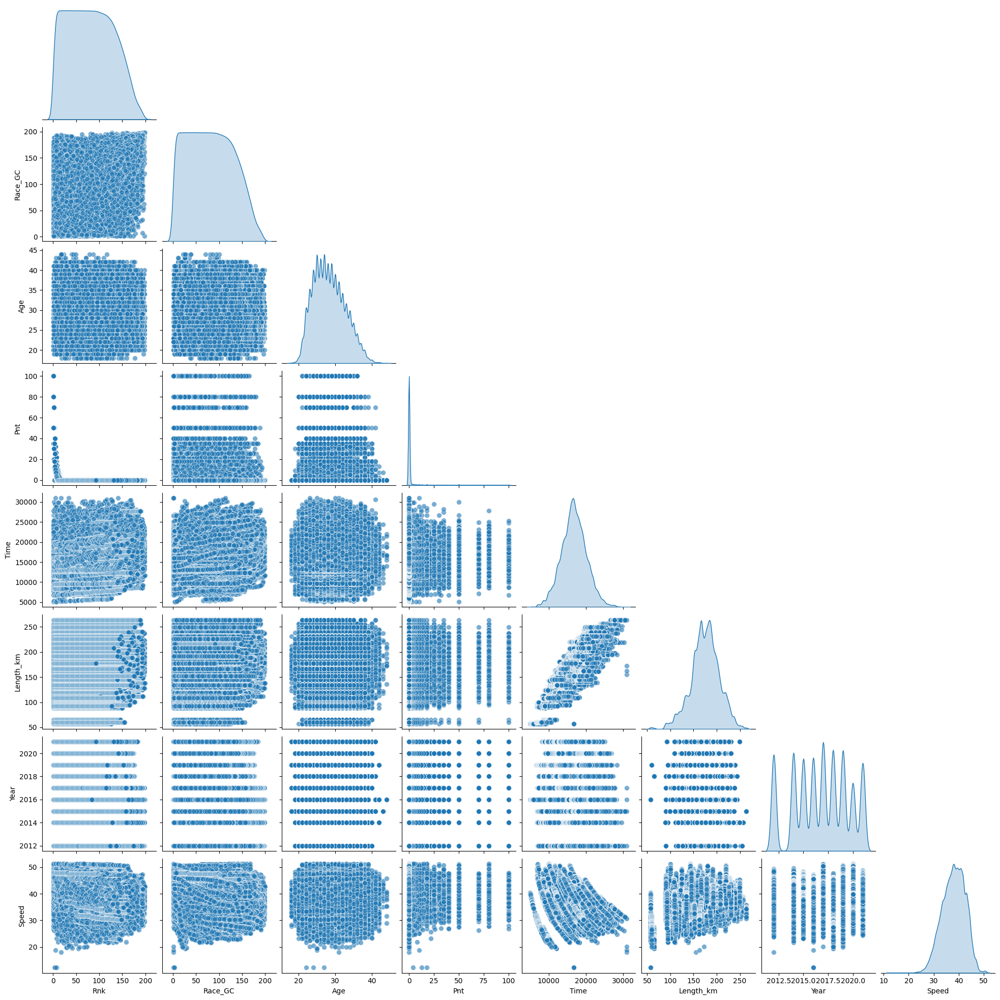

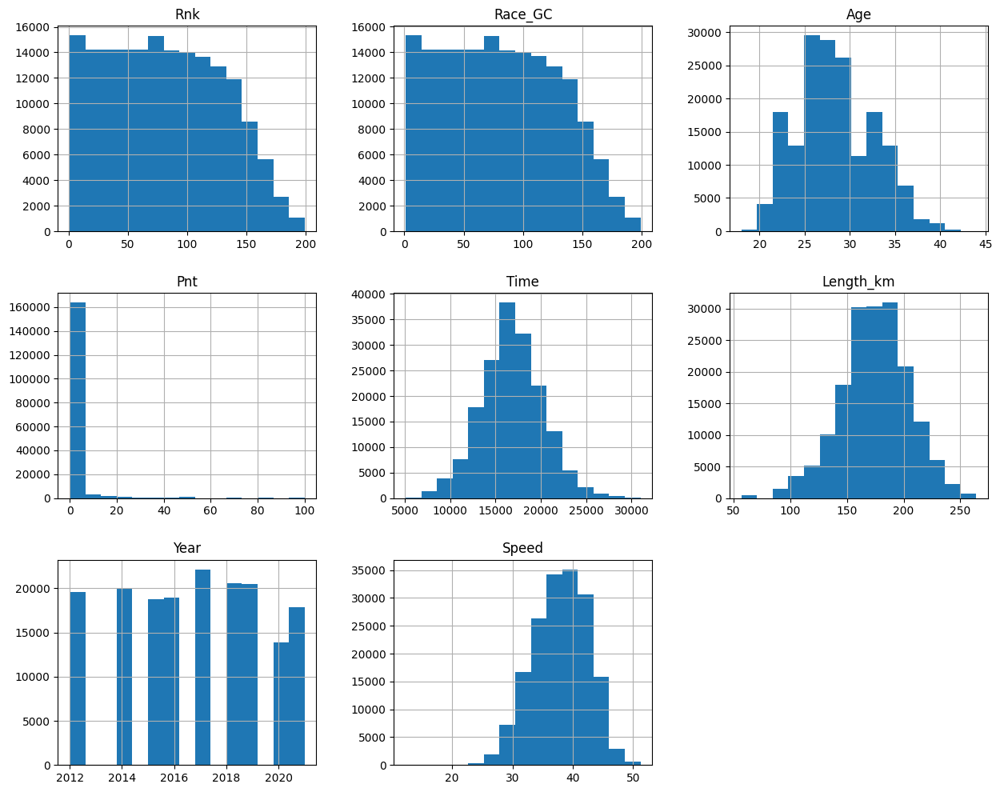

In [10]:
li = []
for filename in glob.glob(os.path.join(results_path, '*.csv')):
    dataframe = pd.read_csv(filename)
    li.append(dataframe)
results = pd.concat(li, axis=0, ignore_index=True)

print('Initial count: ',results.size)

results= results[results.Stage_Type != 'ITT']
invalid_ranks=['DSQ','DNS','DNF','OST','OTL']

query_strings = []
for rank in invalid_ranks:
    query_strings.append(f"Rnk != '{rank}'")

results = results.query(' and '.join(query_strings))

def convert_to_numeric(df, column, type= float, fill=0):
    df[column] = pd.to_numeric(df[column], errors='raise').fillna(fill).astype(type)

results['Rnk'] = results['Rnk'].str.strip()
convert_to_numeric(results,'Rnk', int, 100)
convert_to_numeric(results,'UCI')
convert_to_numeric(results,'Pnt')

filter_query = "Rnk <= 800 and GC <= 800 and Length != '0 km'"
results = results.query(filter_query)

if 'Length' in results.columns:
    results['Length_km'] = results['Length'].astype(str).str.replace(' km', '', regex=False).replace('', np.nan)
    results['Length_km'] = pd.to_numeric(results['Length_km'], errors='raise')
    results.drop(columns=['Length'], inplace=True)

if 'Date' in results.columns:
    results['Date'] = pd.to_datetime(results['Date'],format='mixed', errors='raise')
    results['Year'] = results['Date'].dt.year
    results.drop(columns=['Date'], inplace=True)
else:
    results['Year'] = results.get('Year', 2019)


# Convert Timelag like "+0:04" -> seconds 
def timelag_to_sec(x):
    try:
        if isinstance(x, str) and x.startswith('+'):
            parts = x[1:].split(':')
            if len(parts) == 2:
                return int(parts[0]) * 60 + int(parts[1])
            return float(parts[0])
    except:
        pass
    return 0.0

def is_time_format(input):
    try:
        time.strptime(input, '%H:%M:%S')
        return True
    except ValueError:
        return False

def bugged_format(input): # ex ",,1:20"
    try:
        cleared= input.replace(",,","")
        [min, sec ] =cleared.split(':')
        return int(min)*60 + int(sec)
    except Exception as e:
        return weird_format(input)

def weird_format(input): # ex: 8:298:29
    try:
        [min, sec, rest ] =input.split(':')
        return int(min)*60 + int(sec[:2])
    except Exception as e:
        return 0

def normalize_time(df):
    stage_name = ''
    res = []
    stage = 0
    for row in df.itertuples(index=False):
        raw_time = row.Time
        seconds = 0
        if is_time_format(raw_time):
            [hour,min, sec ] =raw_time.split(':')
            result = int(hour)*3600 + int(min)*60 + int(sec)
            if stage_name != row.Stage_Name:
                stage_name = row.Stage_Name
                stage = result
            else:
                seconds = result
        else:
            seconds = bugged_format(raw_time)
        res.append(stage + seconds + timelag_to_sec(row.Timelag))
    df['Time'] = res


normalize_time(results)

convert_to_numeric(results,'Time')
results['Time'] = results['Time'].replace(0, 
results['Time'].max())

# The actual shortest time is 5077.0 s on a 57 km stage, everything under is an error
results.loc[results["Time"] <= 5076.0, "Time"] = results['Time'].median() 

results.rename(columns={'GC': 'Race_GC'}, inplace=True)

results['Speed'] = results.eval('(Length_km / Time)*3600') #  *3600 Convert from Km/s to Km/h
# Some time values are wrong, so their speed becomes unrealistic 
results.loc[results["Speed"] >= 100, "Speed"] = results['Speed'].median() 

# PCS score values the top 10 more than the UCI score system. The UCI score values the podium
drop_cols = [
    'Race_url', 'Stage_url','Stage#', 'BiB','Team','Unnamed: 0','Timelag',
    'Start', 'Finish', 'Race_ID', 'Stage_Name', 'Race_Name','Stage_Type','Circuit','Category',
    'UCI'
]
drop_existing = [c for c in drop_cols if c in results.columns]
results.drop(columns=drop_existing, inplace=True, errors='raise')

results_plot = results.select_dtypes(include='number')
sns.pairplot(results_plot,diag_kind='kde', corner= True, plot_kws={'alpha':0.6,'s':50})

print('After Cleaning: ',results.size)
# print(results.iloc[0])
results.hist(figsize=(15,12),bins=15)
print(results.min())
print(results.max())
# 323.801105



Riders: Clearing and Feature Selection

Rider            DUPONT Hubert
height                    1.74
weight                    57.0
One day races              353
GC                        2020
Time trial                 107
Sprint                     426
Climber                   1341
PCS Ranking               2083
Name: 8, dtype: object
Rider            ŠTYBAR Zdeněk
height                    2.04
weight                    90.0
One day races            12579
GC                       13007
Time trial               10809
Sprint                   15910
Climber                  16783
PCS Ranking               2083
dtype: object


array([[<Axes: title={'center': 'height'}>,
        <Axes: title={'center': 'weight'}>,
        <Axes: title={'center': 'One day races'}>],
       [<Axes: title={'center': 'GC'}>,
        <Axes: title={'center': 'Time trial'}>,
        <Axes: title={'center': 'Sprint'}>],
       [<Axes: title={'center': 'Climber'}>,
        <Axes: title={'center': 'PCS Ranking'}>, <Axes: >]], dtype=object)

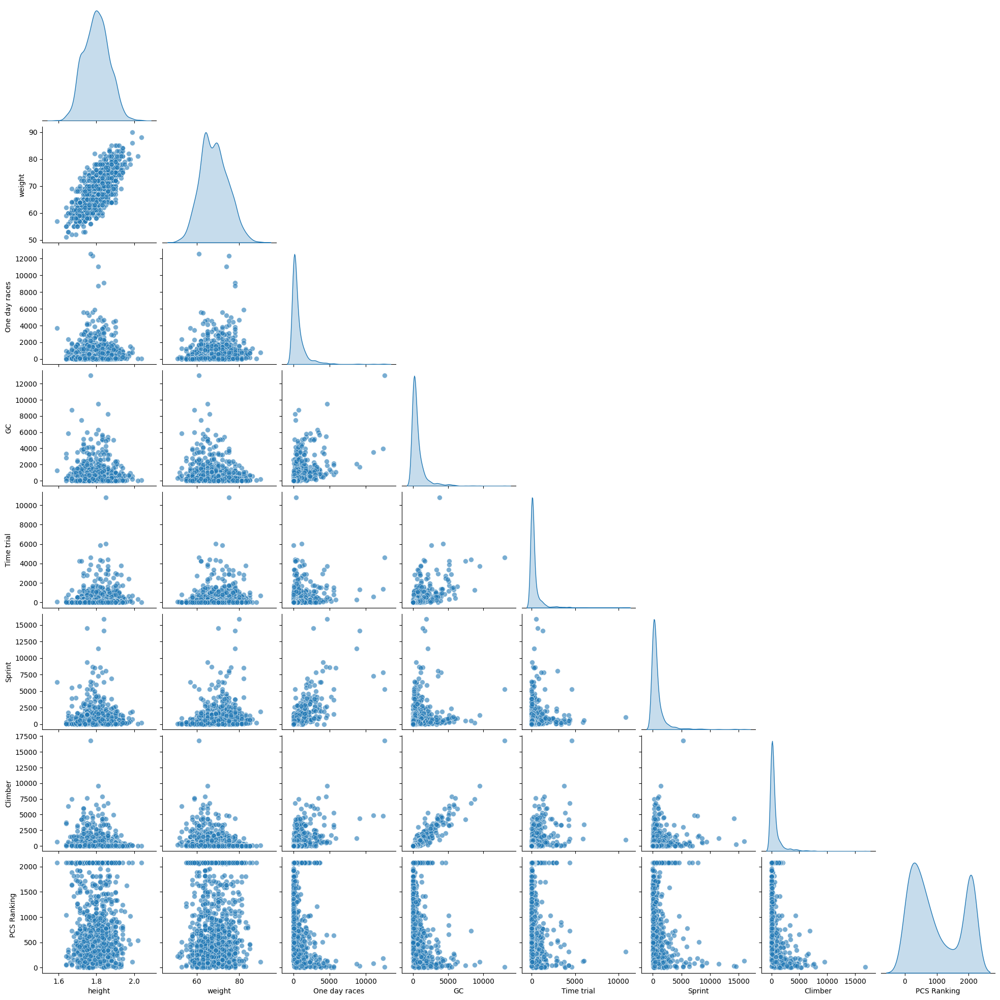

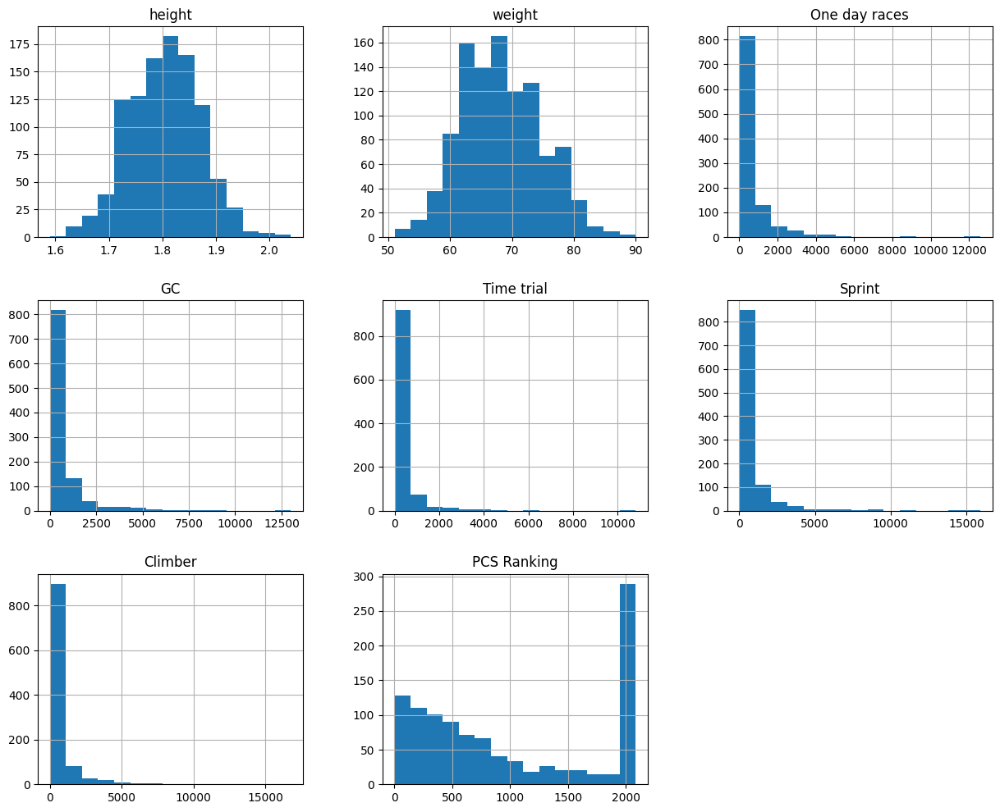

In [11]:
def convert_json(df, column):
    df[column] = df[column].apply(lambda x : dict(eval(x)) )
    df2 = df[column].apply(pd.Series )
    return pd.concat([df, df2], axis=1).drop(column, axis=1)


riders = pd.read_csv(riders_path)


riders = convert_json(riders,'pps')
riders = convert_json(riders,'rdr')

small_is_best = ['PCS Ranking','UCI World Ranking','Specials | All Time Ranking',]
num_columns = ['PCS Ranking','UCI World Ranking','Specials | All Time Ranking','One day races','GC','Time trial','Sprint','Climber']

for column in num_columns:
    convert_to_numeric(riders,column ,int)

    
for column in small_is_best:
    riders[column] = riders[column].replace(0, 
    riders[column].max()+1) 

riders['weight'] = riders['weight'].replace(0, 
riders['weight'].mean())

riders['height'] = riders['height'].replace(0, 
riders['height'].mean())



riders.rename(columns={'fullname': 'Rider'}, inplace=True)

drop_cols = [
    'Unnamed: 0','team','birthdate', 'country','rider_url', 'UCI World Ranking', 'Specials | All Time Ranking'
]
drop_existing = [c for c in drop_cols if c in riders.columns]
riders.drop(columns=drop_existing, inplace=True, errors='ignore')

print(riders.iloc[8])
print(riders.max())

riders_plot = riders.select_dtypes(include='number')
sns.pairplot(riders_plot,diag_kind='kde', corner= True, plot_kws={'alpha':0.6,'s':50})
riders_plot.hist(figsize=(15,12),bins=15)

Combine Data Sets

2244527


array([[<Axes: title={'center': 'Rnk'}>,
        <Axes: title={'center': 'Race_GC'}>,
        <Axes: title={'center': 'Age'}>, <Axes: title={'center': 'Pnt'}>],
       [<Axes: title={'center': 'Time'}>,
        <Axes: title={'center': 'Length_km'}>,
        <Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'Speed'}>],
       [<Axes: title={'center': 'height'}>,
        <Axes: title={'center': 'weight'}>,
        <Axes: title={'center': 'One day races'}>,
        <Axes: title={'center': 'GC'}>],
       [<Axes: title={'center': 'Time trial'}>,
        <Axes: title={'center': 'Sprint'}>,
        <Axes: title={'center': 'Climber'}>,
        <Axes: title={'center': 'PCS Ranking'}>]], dtype=object)

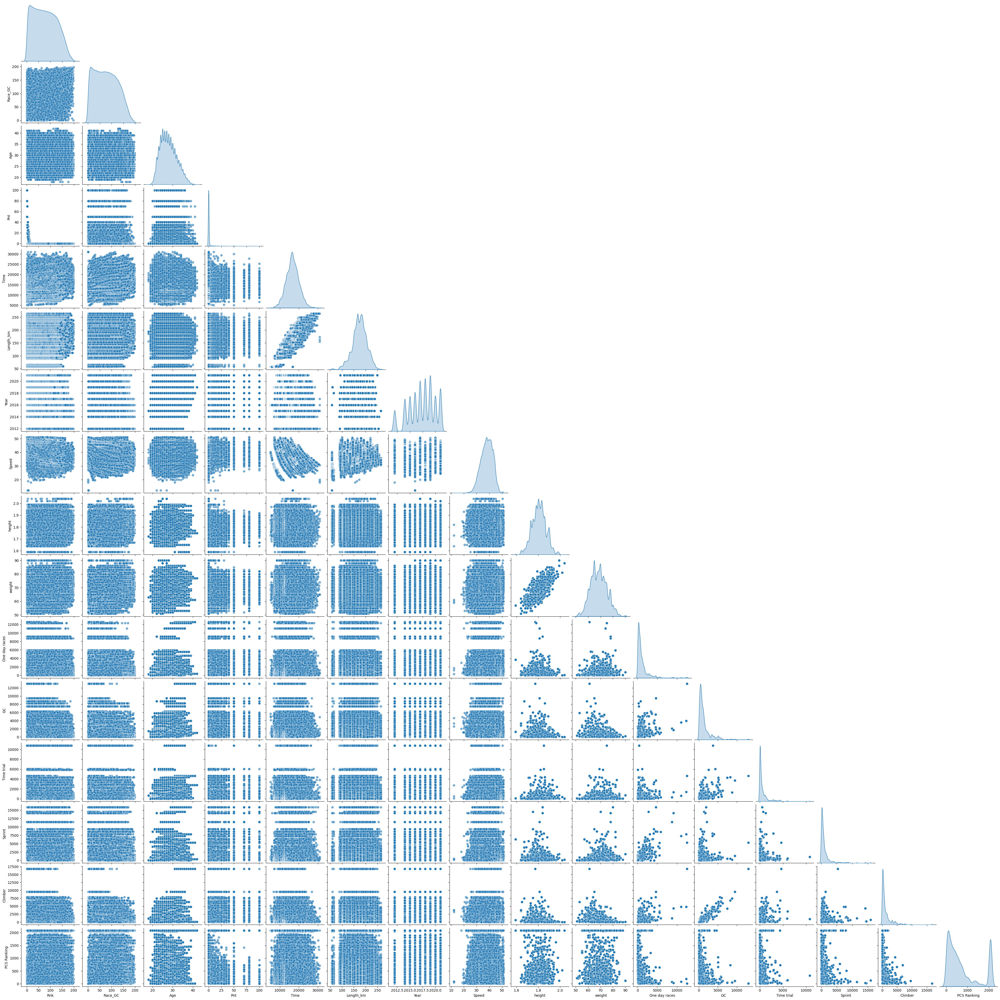

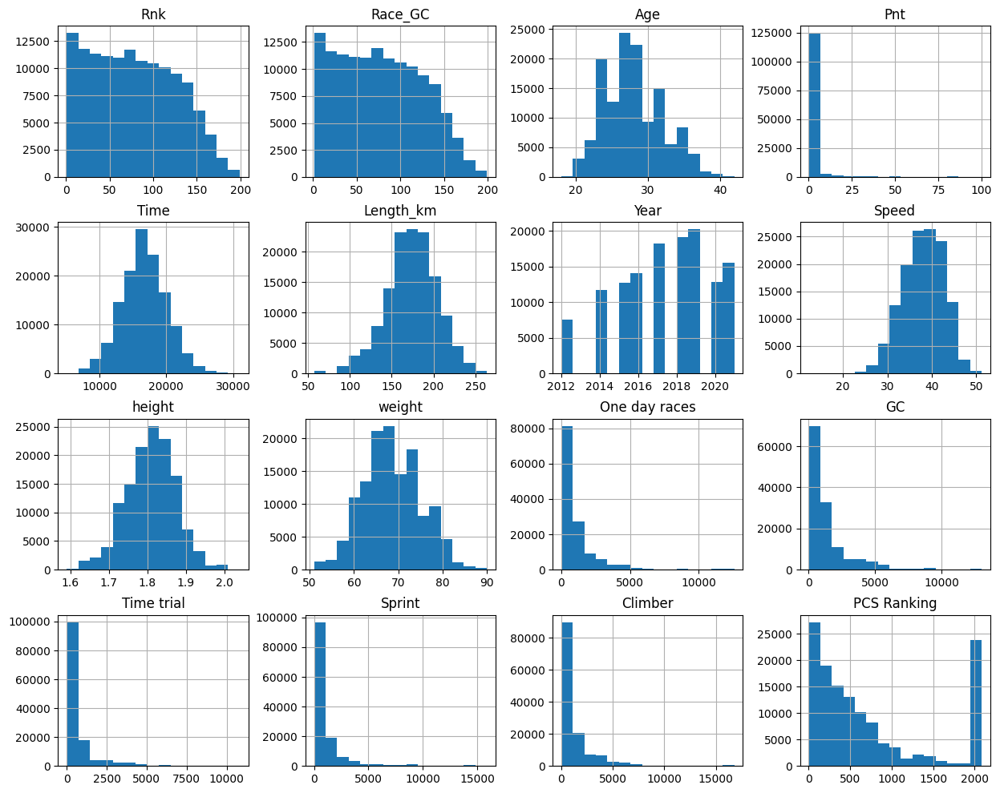

In [12]:
final_df = pd.merge(results, riders, on='Rider', how='inner')

print(final_df.size)
final_df.to_csv(final_path)
final_plot = final_df.select_dtypes(include='number')
sns.pairplot(final_plot,diag_kind='kde', corner= True, plot_kws={'alpha':0.6,'s':50})
final_plot.hist(figsize=(15,12),bins=15)
